# Dataset
https://www.kaggle.com/datasets/fanconic/skin-cancer-malignant-vs-benign 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pathlib
import os
import glob as gb
import glob
import cv2
import tensorflow as tf

In [2]:
train_dir='Skin Cancer Malignant vsBenign/train/'
test_dir='Skin Cancer Malignant vsBenign/test/'

In [3]:
size=224
from tf.keras.applications.mobilenet_v2 import  preprocess_input

train_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rotation_range=0,
    width_shift_range=0.0,
    height_shift_range=0.0,
    shear_range=0.0,
    zoom_range=0.0,
    horizontal_flip=False,
    vertical_flip=False,
    rescale=1/255.0,
    preprocessing_function=None,
    validation_split=0.1,
).flow_from_directory(train_dir,batch_size=16,target_size=(size,size),subset="training",shuffle=True)


Found 2374 images belonging to 2 classes.


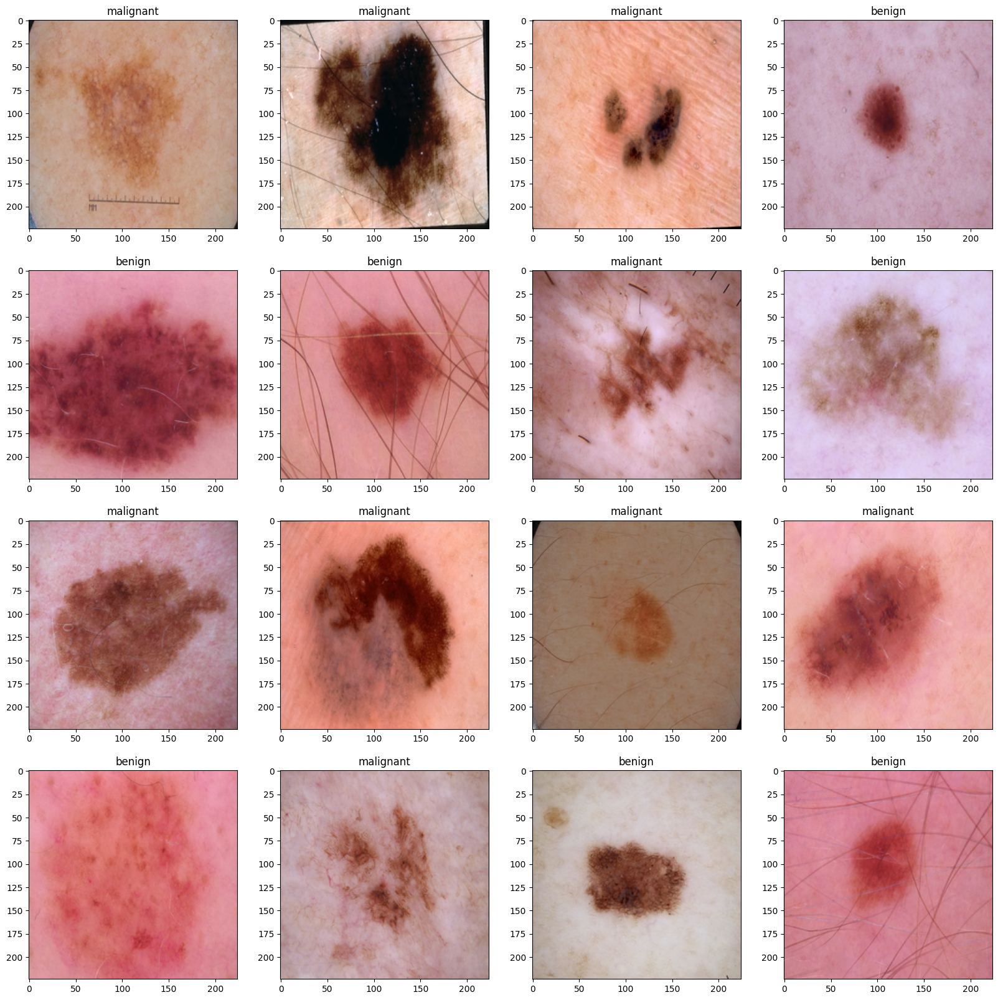

In [4]:
classes=list(train_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in train_generator:
    # create a grid of 3x3 images
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])
    # show the plot
    plt.show()
    break

In [5]:
classes

['benign', 'malignant']

In [6]:
valid_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    preprocessing_function=None,
    validation_split=0.1,
).flow_from_directory(train_dir,batch_size=16,target_size=(size,size),subset='validation',shuffle=False)


Found 263 images belonging to 2 classes.


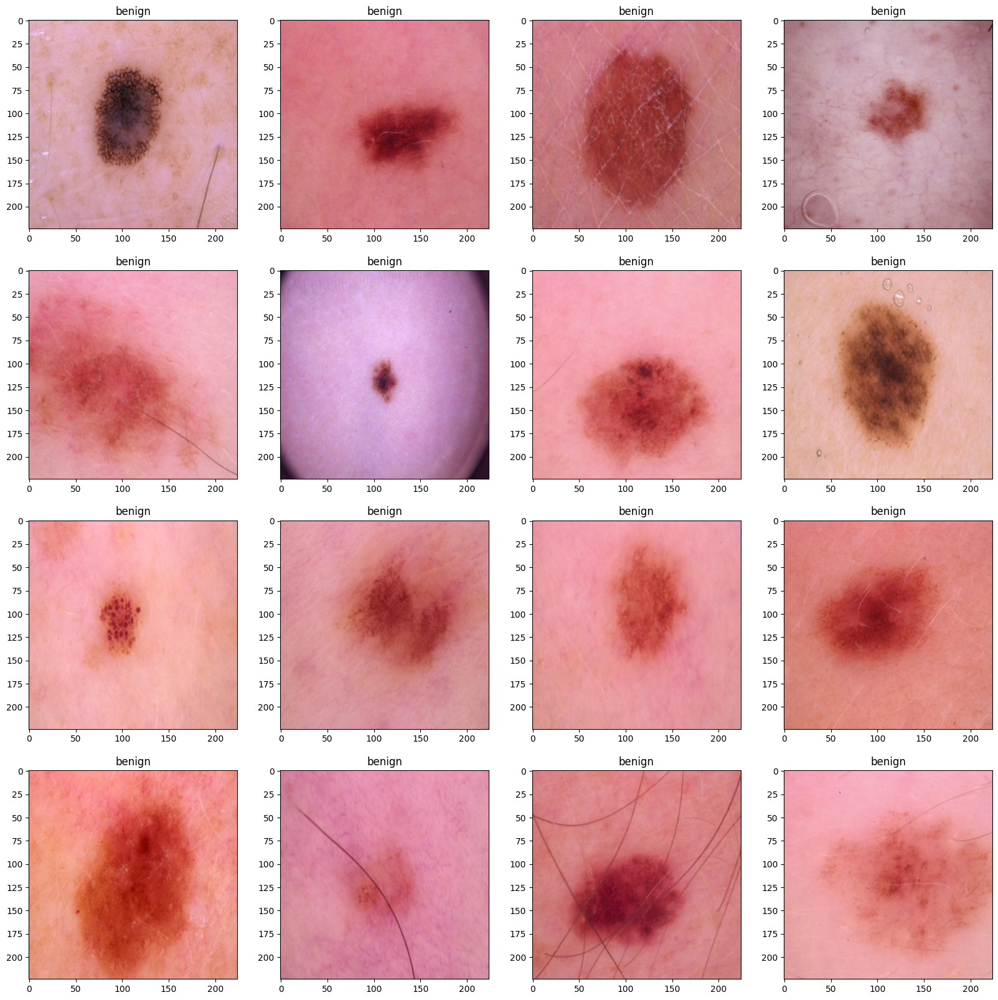

In [7]:
classes=list(valid_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in valid_generator:
    # create a grid of 3x3 images
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])
    # show the plot
    plt.show()
    break

In [8]:
test_generator=tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    preprocessing_function=None
).flow_from_directory(test_dir,batch_size=16,target_size=(size,size),shuffle=False)


Found 660 images belonging to 2 classes.


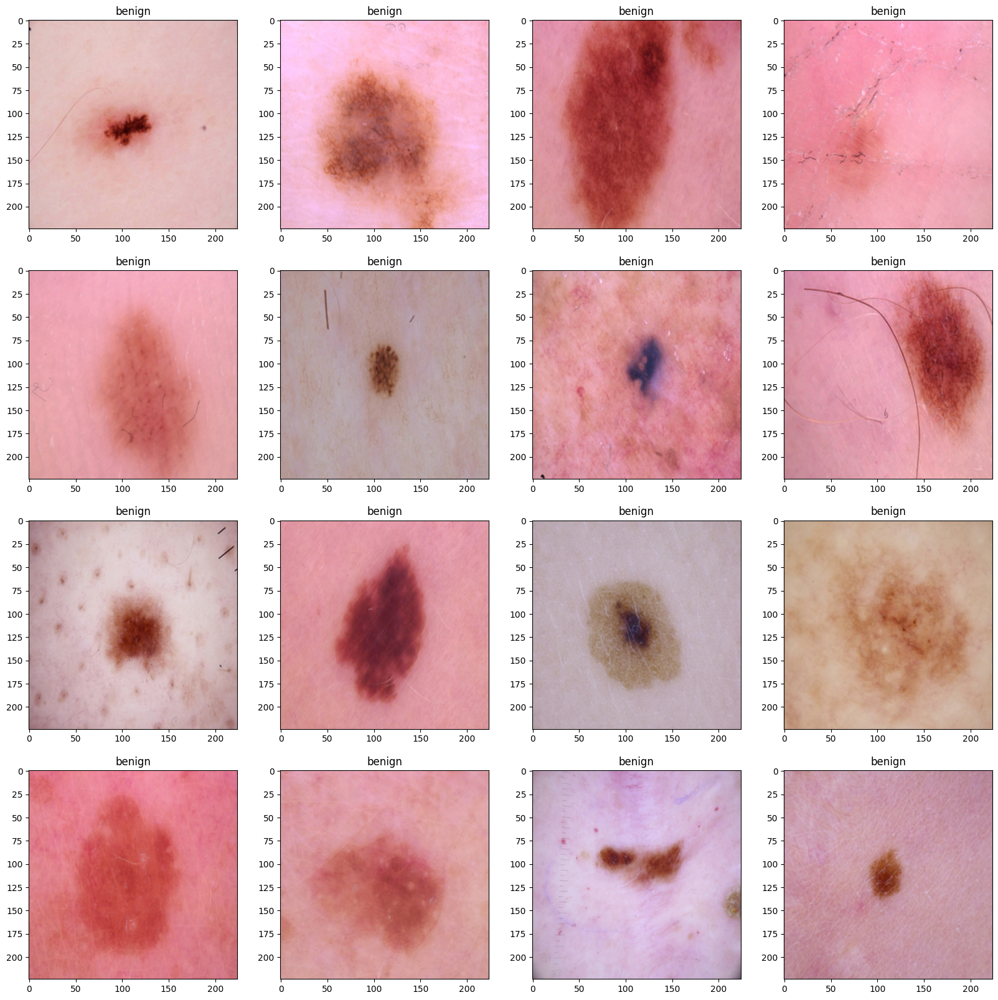

In [9]:
classes=list(test_generator.class_indices.keys())
plt.figure(figsize=(20,20))
for X_batch, y_batch in test_generator:
    # create a grid of 3x3 images
    for i in range(0,16):
        plt.subplot(4,4,i+1)
        plt.imshow(X_batch[i])
        plt.title(classes[np.where(y_batch[i]==1)[0][0]])
    # show the plot
    plt.show()
    break

In [2]:
from tensorflow.keras.applications.resnet import ResNet152
from tensorflow import keras

In [12]:
pretrained = ResNet152(
    input_shape=(size, size, 3),
    include_top=False,
    weights='imagenet'
)
pretrained.trainable = False

model = keras.models.Sequential()
model.add(pretrained)
#model.add(keras.layers.GlobalAvgPool2D())
model.add(keras.layers.Flatten(name="Flatten1"))
model.add(keras.layers.Dense(128, activation=keras.layers.LeakyReLU(alpha=0.02), name="Dense1"))
model.add(keras.layers.Dense(2, activation="softmax", name="Output"))

# The model’s summary() method displays all the model’s layers
print(model.summary())



Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet152 (Functional)      (None, 7, 7, 2048)        58370944  
                                                                 
 Flatten1 (Flatten)          (None, 100352)            0         
                                                                 
 Dense1 (Dense)              (None, 128)               12845184  
                                                                 
 Output (Dense)              (None, 2)                 258       
                                                                 
Total params: 71,216,386
Trainable params: 12,845,442
Non-trainable params: 58,370,944
_________________________________________________________________
None


In [ ]:

"""
# InceptionResNetV2 img(299,299)
base_model = tf.keras.applications.inception_resnet_v2.InceptionResNetV2(weights="imagenet",include_top=False)

avg = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
H1 = tf.keras.layers.Dense(256, activation="relu", kernel_initializer="he_normal")(avg)
B1 = tf.keras.layers.BatchNormalization()(H1)
H2 = tf.keras.layers.Dense(128, activation="relu", kernel_initializer="he_normal")(B1)
B2 = tf.keras.layers.BatchNormalization()(H2)
H3 = tf.keras.layers.Dense(64, activation="relu", kernel_initializer="he_normal")(B2)
B3 = tf.keras.layers.BatchNormalization()(H3)
output = tf.keras.layers.Dense(1, activation="sigmoid", kernel_initializer="glorot_uniform")(B3)

model = tf.keras.Model(inputs=base_model.input, outputs=output)
"""

"""
# Xception img(299,299)
base_model = tf.keras.applications.xception.Xception(weights="imagenet",include_top=False)
avg = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
output = tf.keras.layers.Dense(1, activation="sigmoid")(avg)
model = tf.keras.Model(inputs=base_model.input, outputs=output)
"""

"""
# InceptionV3 img(299,299)
base_model = tf.keras.applications.inception_v3.InceptionV3(weights="imagenet",include_top=False)
avg = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
output = tf.keras.layers.Dense(1, activation="sigmoid")(avg)
model = tf.keras.Model(inputs=base_model.input, outputs=output)
"""

"""
# InceptionResNetV2 img(299,299)
base_model = tf.keras.applications.inception_resnet_v2.InceptionResNetV2(weights="imagenet",include_top=False)
avg = tf.keras.layers.GlobalAveragePooling2D()(base_model.output)
output = tf.keras.layers.Dense(1, activation="sigmoid")(avg)
model = tf.keras.Model(inputs=base_model.input, outputs=output)
"""

"""
# VGG16 img(224,224)
base_model = tf.keras.applications.vgg16.VGG16(weights="imagenet",include_top=False,
                         input_tensor=keras.layers.Input(shape=(512, 512,3)))
                 
model = tf.keras.models.Sequential()
model.add(base_model)
model.add(tf.keras.layers.Flatten())
model.add(tf.keras.layers.Dense(1, activation="sigmoid"))
"""

In [13]:
# Compiling the model
optimizer = keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)
# optimizer = keras.optimizers.SGD(learning_rate=0.001, momentum=0.9)

model.compile(loss="categorical_crossentropy", optimizer= optimizer, metrics=["accuracy"])

# Learning rate scheduling
lr_scheduler = keras.callbacks.ReduceLROnPlateau(factor=0.00001, patience=5,
                                      monitor="val_accuracy", min_lr=0.0000001)

# Interrupts training when it measures no progress on the validation set
early_stopping_cb = keras.callbacks.EarlyStopping(patience=20, monitor = "val_loss",
                                                  restore_best_weights=True)


In [14]:
# Training the model
history = model.fit(train_generator,
                    steps_per_epoch = len(train_generator) ,
                    epochs          = 10,  
                    validation_data = valid_generator, 
                    validation_steps=len(valid_generator),
                    callbacks = [lr_scheduler, early_stopping_cb])

Epoch 1/10
149/149 [==============================] - 40s 182ms/step - loss: 1.3062 - accuracy: 0.5602 - val_loss: 0.6662 - val_accuracy: 0.7567 - lr: 0.0010
Epoch 2/10
149/149 [==============================] - 23s 157ms/step - loss: 0.6406 - accuracy: 0.6516 - val_loss: 0.6294 - val_accuracy: 0.6046 - lr: 0.0010
Epoch 3/10
149/149 [==============================] - 23s 156ms/step - loss: 0.5984 - accuracy: 0.6794 - val_loss: 0.7233 - val_accuracy: 0.4639 - lr: 0.0010
Epoch 4/10
149/149 [==============================] - 24s 159ms/step - loss: 0.5800 - accuracy: 0.6908 - val_loss: 0.5647 - val_accuracy: 0.6654 - lr: 0.0010
Epoch 5/10
149/149 [==============================] - 24s 160ms/step - loss: 0.5429 - accuracy: 0.7334 - val_loss: 0.5210 - val_accuracy: 0.7567 - lr: 0.0010
Epoch 6/10
149/149 [==============================] - 24s 158ms/step - loss: 0.5627 - accuracy: 0.7051 - val_loss: 0.6220 - val_accuracy: 0.6844 - lr: 0.0010
Epoch 7/10
149/149 [==============================] 

In [15]:
history.history

{'loss': [1.3062329292297363,
  0.64055997133255,
  0.5984121561050415,
  0.5800483822822571,
  0.542900025844574,
  0.5626540184020996,
  0.6034112572669983,
  0.6033771634101868,
  0.6033399701118469,
  0.6033017635345459],
 'accuracy': [0.5602359175682068,
  0.6516427993774414,
  0.6794439554214478,
  0.6908171772956848,
  0.7333614230155945,
  0.7051389813423157,
  0.7232518792152405,
  0.7232518792152405,
  0.721145749092102,
  0.721145749092102],
 'val_loss': [0.66616290807724,
  0.6293562054634094,
  0.7233052253723145,
  0.564706563949585,
  0.5210340619087219,
  0.6220105290412903,
  0.6219895482063293,
  0.6219671368598938,
  0.6219393014907837,
  0.6219145059585571],
 'val_accuracy': [0.7566539645195007,
  0.6045627593994141,
  0.463878333568573,
  0.6653992533683777,
  0.7566539645195007,
  0.6844106316566467,
  0.6806083917617798,
  0.6768060922622681,
  0.6730037927627563,
  0.6692014932632446],
 'lr': [0.001, 0.001, 0.001, 0.001, 0.001, 0.001, 1e-07, 1e-07, 1e-07, 1e-07]

In [16]:
#plotting training values
import seaborn as sns
sns.set()

acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(loss) + 1)

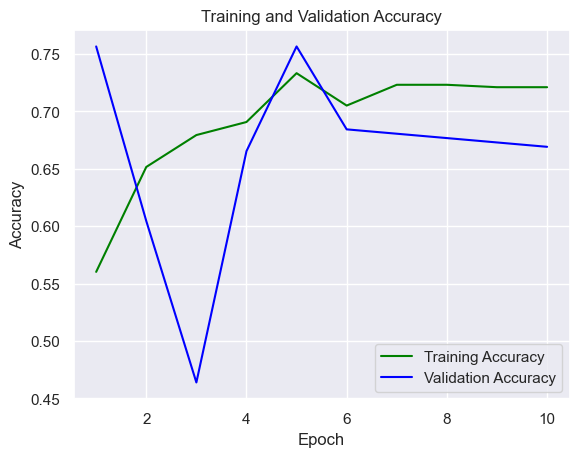

In [17]:
#accuracy plot
plt.plot(epochs, acc, color='green', label='Training Accuracy')
plt.plot(epochs, val_acc, color='blue', label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

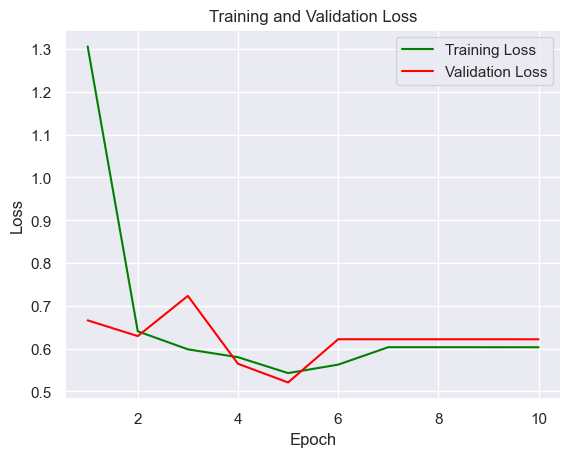

In [18]:
plt.figure()
#loss plot
plt.plot(epochs, loss, color='green', label='Training Loss')
plt.plot(epochs, val_loss, color='red', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [19]:
# Evaluate the model
model_evaluate = model.evaluate(test_generator)
print("Loss     : ",model_evaluate[0])
print("accuracy : ",model_evaluate[1])

42/42 [==============================] - 6s 145ms/step - loss: 0.6038 - accuracy: 0.7242
Loss     :  0.603754460811615
accuracy :  0.7242424488067627


In [20]:
predictions = model.predict(test_generator)

42/42 [==============================] - 8s 137ms/step


In [21]:
from sklearn.metrics import classification_report
print(classification_report(test_generator.classes, predictions.argmax(axis=-1)))

              precision    recall  f1-score   support

           0       0.69      0.90      0.78       360
           1       0.81      0.52      0.63       300

    accuracy                           0.72       660
   macro avg       0.75      0.71      0.71       660
weighted avg       0.74      0.72      0.71       660



<Axes: >

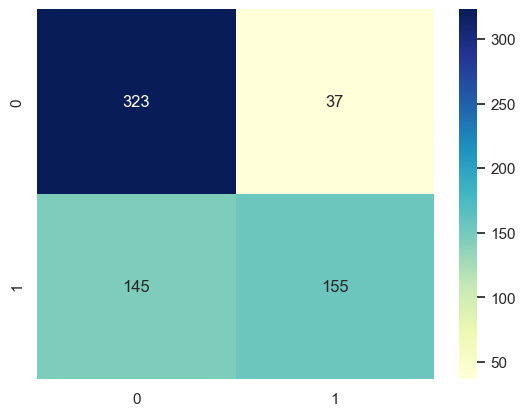

In [22]:
import seaborn as sns
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(test_generator.classes, predictions.argmax(axis=-1))

sns.heatmap(cm,  annot=True, fmt="d" ,cmap="YlGnBu")

In [23]:
model.save('Cancer.h5')

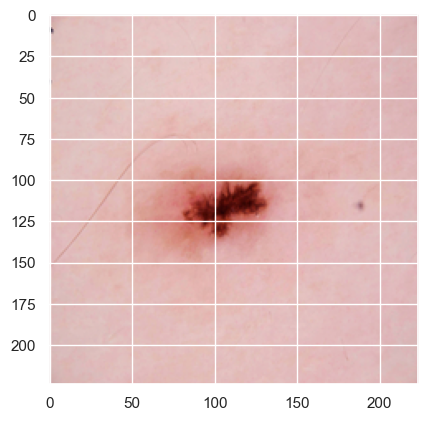

(1, 224, 224, 3)
1/1 [==============================] - 3s 3s/step
[0]


In [25]:
img = cv2.imread("1.jpg")
H,W,C = 224,224,3
img = cv2.resize(img, (H, W)) 
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
img = np.array(img)
img = img.astype("float32")  
img = img / 255.0

plt.imshow(img)
plt.show()

img = img.reshape(1,H,W,C)
print(img.shape)



prediction = np.argmax(model.predict(img),axis=-1)
print(prediction)



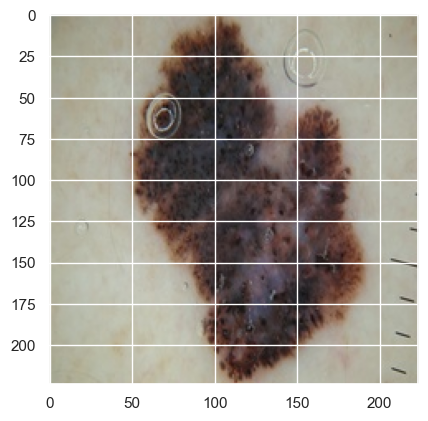

(1, 224, 224, 3)
1/1 [==============================] - 0s 37ms/step
[1]


In [26]:
img = cv2.imread("3.jpg")
H,W,C = 224,224,3
img = cv2.resize(img, (H, W)) 
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) 
img = np.array(img)
img = img.astype("float32")  
img = img / 255.0

plt.imshow(img)
plt.show()

img = img.reshape(1,H,W,C)
print(img.shape)



prediction = np.argmax(model.predict(img),axis=-1)
print(prediction)



In [5]:
# https://gradio.app/docs/

import tensorflow as tf
from tensorflow import keras
import numpy as np
import gradio as gr
import requests
import cv2

model = tf.keras.models.load_model('Cancer.h5')

def inference(img):
    labels =['benign', 'malignant']
    H,W,C = 224,224,3
    img = cv2.resize(img, (H, W)) 
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = np.array(img)
    img = img.astype("float32")/255.0
    img = img.reshape(1,H,W,C)
    pred = model.predict(img).flatten()
    prediction = [pred[0], pred[1]]
    dictionary = dict(zip(labels, map(float, prediction)))
    return dictionary

nbr_top_classes = 2
gr.Interface(fn=inference, 
             inputs=gr.Image(), 
             outputs=gr.Label(num_top_classes=nbr_top_classes),
             theme="dark"
             ).launch(share=False) #, debug=True Use in Colab


C:\Users\Nvidia\anaconda3\envs\py310\lib\site-packages\gradio\blocks.py:555: UserWarning: Cannot load dark. Caught Exception: 404 Client Error: Not Found for url: https://huggingface.co/api/spaces/dark (Request ID: Root=1-65eef0ad-593125ff4e03217052febdf7;51f7db20-7237-4f97-88f1-a9ead9987aef)

Sorry, we can't find the page you are looking for.
  warnings.warn(f"Cannot load {theme}. Caught Exception: {str(e)}")


Running on local URL:  http://127.0.0.1:7863

To create a public link, set `share=True` in `launch()`.


1/1 [==============================] - 0s 46ms/step
